# Регрессия на доходность первого месяца

### Импорты

In [1]:
import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import shap

from scipy.stats import spearmanr, pearsonr, kendalltau

import warnings
warnings.filterwarnings("ignore")

### Датафрейм

In [2]:
path = '../../../data/final/pairs.csv'

data = pd.read_csv(path, index_col = 0)
data.head(3)

,views,forwards,thumb_up_react_cnt,thumb_down_react_cnt,mindblowing_react_cnt,heart_react_cnt,thinking_react_cnt,crying_react_cnt,fire_react_cnt,clap_react_cnt,...,free_bird_react_cnt_x_positive_div_by_days,snowman_react_cnt_x_positive_div_by_days,banana_react_cnt_x_positive_div_by_days,poop_react_cnt_x_positive_div_by_days,rofl_smile_react_cnt_x_positive_div_by_days,clown_smile_react_cnt_x_positive_div_by_days,devil_smile_react_cnt_x_positive_div_by_days,hundred_react_cnt_x_positive_div_by_days,head_arm_smile_react_cnt_x_positive_div_by_days,eyes_react_cnt_x_positive_div_by_days
0,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0
1,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0
2,63078,63,251,19,0,27,36,0,2,0,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0


In [3]:
cols = ['views',
 'forwards',
 'thumb_up_react_cnt',
 'thumb_down_react_cnt',
 'mindblowing_react_cnt',
 'heart_react_cnt',
 'thinking_react_cnt',
 'crying_react_cnt',
 'fire_react_cnt',
 'clap_react_cnt',
 'whale_react_cnt',
 'champaign_react_cnt',
 'heart_fire_react_cnt',
 'okay_react_cnt',
 'smile_stars_react_cnt',
 'smiling_react_cnt',
 'cheers_react_cnt',
 'lovely_smile_react_cnt',
 'drunk_smile_react_cnt',
 'angry_smile_react_cnt',
 'shicked_smile_react_cnt',
 'moos_smile_react_cnt',
 'hotdog_react_cnt',
 'free_bird_react_cnt',
 'snowman_react_cnt',
 'banana_react_cnt',
 'poop_react_cnt',
 'rofl_smile_react_cnt',
 'clown_smile_react_cnt',
 'devil_smile_react_cnt',
 'hundred_react_cnt',
 'head_arm_smile_react_cnt',
 'eyes_react_cnt',
 'days_before_ipo',
 'text_len',
 'price',
 'delta_price',
 'delta_perc',
 'open',
 'delta_open',
 'delta_perc_on_ipo_date',
 'positive_score',
 'views_x_positive',
 'forwards_x_positive',
 'thumb_up_react_cnt_x_positive',
 'thumb_down_react_cnt_x_positive',
 'mindblowing_react_cnt_x_positive',
 'heart_react_cnt_x_positive',
 'thinking_react_cnt_x_positive',
 'crying_react_cnt_x_positive',
 'fire_react_cnt_x_positive',
 'clap_react_cnt_x_positive',
 'whale_react_cnt_x_positive',
 'champaign_react_cnt_x_positive',
 'heart_fire_react_cnt_x_positive',
 'okay_react_cnt_x_positive',
 'smile_stars_react_cnt_x_positive',
 'smiling_react_cnt_x_positive',
 'cheers_react_cnt_x_positive',
 'lovely_smile_react_cnt_x_positive',
 'drunk_smile_react_cnt_x_positive',
 'angry_smile_react_cnt_x_positive',
 'shicked_smile_react_cnt_x_positive',
 'moos_smile_react_cnt_x_positive',
 'hotdog_react_cnt_x_positive',
 'free_bird_react_cnt_x_positive',
 'snowman_react_cnt_x_positive',
 'banana_react_cnt_x_positive',
 'poop_react_cnt_x_positive',
 'rofl_smile_react_cnt_x_positive',
 'clown_smile_react_cnt_x_positive',
 'devil_smile_react_cnt_x_positive',
 'hundred_react_cnt_x_positive',
 'head_arm_smile_react_cnt_x_positive',
 'eyes_react_cnt_x_positive',
 'views_div_by_days',
 'forwards_div_by_days',
 'thumb_up_react_cnt_div_by_days',
 'thumb_down_react_cnt_div_by_days',
 'mindblowing_react_cnt_div_by_days',
 'heart_react_cnt_div_by_days',
 'thinking_react_cnt_div_by_days',
 'crying_react_cnt_div_by_days',
 'fire_react_cnt_div_by_days',
 'clap_react_cnt_div_by_days',
 'whale_react_cnt_div_by_days',
 'champaign_react_cnt_div_by_days',
 'heart_fire_react_cnt_div_by_days',
 'okay_react_cnt_div_by_days',
 'smile_stars_react_cnt_div_by_days',
 'smiling_react_cnt_div_by_days',
 'cheers_react_cnt_div_by_days',
 'lovely_smile_react_cnt_div_by_days',
 'drunk_smile_react_cnt_div_by_days',
 'angry_smile_react_cnt_div_by_days',
 'shicked_smile_react_cnt_div_by_days',
 'moos_smile_react_cnt_div_by_days',
 'hotdog_react_cnt_div_by_days',
 'free_bird_react_cnt_div_by_days',
 'snowman_react_cnt_div_by_days',
 'banana_react_cnt_div_by_days',
 'poop_react_cnt_div_by_days',
 'rofl_smile_react_cnt_div_by_days',
 'clown_smile_react_cnt_div_by_days',
 'devil_smile_react_cnt_div_by_days',
 'hundred_react_cnt_div_by_days',
 'head_arm_smile_react_cnt_div_by_days',
 'eyes_react_cnt_div_by_days',
 'text_len_div_by_days',
 'positive_score_div_by_days',
 'views_x_positive_div_by_days',
 'forwards_x_positive_div_by_days',
 'thumb_up_react_cnt_x_positive_div_by_days',
 'thumb_down_react_cnt_x_positive_div_by_days',
 'mindblowing_react_cnt_x_positive_div_by_days',
 'heart_react_cnt_x_positive_div_by_days',
 'thinking_react_cnt_x_positive_div_by_days',
 'crying_react_cnt_x_positive_div_by_days',
 'fire_react_cnt_x_positive_div_by_days',
 'clap_react_cnt_x_positive_div_by_days',
 'whale_react_cnt_x_positive_div_by_days',
 'champaign_react_cnt_x_positive_div_by_days',
 'heart_fire_react_cnt_x_positive_div_by_days',
 'okay_react_cnt_x_positive_div_by_days',
 'smile_stars_react_cnt_x_positive_div_by_days',
 'smiling_react_cnt_x_positive_div_by_days',
 'cheers_react_cnt_x_positive_div_by_days',
 'lovely_smile_react_cnt_x_positive_div_by_days',
 'drunk_smile_react_cnt_x_positive_div_by_days',
 'angry_smile_react_cnt_x_positive_div_by_days',
 'shicked_smile_react_cnt_x_positive_div_by_days',
 'moos_smile_react_cnt_x_positive_div_by_days',
 'hotdog_react_cnt_x_positive_div_by_days',
 'free_bird_react_cnt_x_positive_div_by_days',
 'snowman_react_cnt_x_positive_div_by_days',
 'banana_react_cnt_x_positive_div_by_days',
 'poop_react_cnt_x_positive_div_by_days',
 'rofl_smile_react_cnt_x_positive_div_by_days',
 'clown_smile_react_cnt_x_positive_div_by_days',
 'devil_smile_react_cnt_x_positive_div_by_days',
 'hundred_react_cnt_x_positive_div_by_days',
 'head_arm_smile_react_cnt_x_positive_div_by_days',
 'eyes_react_cnt_x_positive_div_by_days']

target = '1m_price'

In [4]:
data = data[data[target].notnull()]

X = data[cols]
y = data[target]

### Results collection

In [5]:
results = pd.DataFrame(columns = ['MAPE', 'Spearman', 'Pearson', 'Kendall'])

### Baseline model

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.20, random_state=0)

In [7]:
model = LinearRegression()

model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

In [8]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
kendall_train = round(kendalltau(y_train, y_pred_train)[0], 4)
kendall_test = round(kendalltau(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'baseline_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'baseline_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1013,0.3071,0.4831,0.2334
baseline_test,0.1035,0.2944,0.3831,0.2241


### Feature selection

1. Null drop
2. Nonsense drop
3. Correlation drop
4. Manual linearization
5. Correlation drop

In [9]:
import sys
sys.path.insert(1, '../../pipeline')

import pipeline as pl

In [10]:
cols = X_train.columns
print(f'{len(cols)} features before pipeline')

143 features before pipeline


### Null drop

In [11]:
cols = pl.null_drop(X, cutoff = 0.5)
print(f'{len(cols)} features remain')

143 features remain


### Nonsense drop

In [12]:
cols = pl.nonsense_drop(X[cols], 0.9)
print(f'{len(cols)} features remain')

47 features remain


In [13]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [14]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_nonsense_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_nonsense_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1013,0.3071,0.4831,0.2334
baseline_test,0.1035,0.2944,0.3831,0.2241
after_nonsense_drop_train,0.1016,0.3003,0.4735,0.2334
after_nonsense_drop_test,0.1025,0.2952,0.4599,0.2241


### Soft correlation drop

In [15]:
cols = pl.corr_drop(X[cols], y,  0.8)
print(f'{len(cols)} features remain')

price (0.0079) was removed by open (0.0111)
delta_price (0.0101) was removed by delta_perc (0.0105)
delta_perc (0.0105) was removed by delta_perc_on_ipo_date (0.0105)
heart_react_cnt_x_positive_div_by_days (0.0168) was removed by heart_react_cnt_div_by_days (0.0556)
smiling_react_cnt_x_positive_div_by_days (0.0019) was removed by smiling_react_cnt_div_by_days (0.0087)
42 features remain


In [16]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [17]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_soft_correlation_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_soft_correlation_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1013,0.3071,0.4831,0.2334
baseline_test,0.1035,0.2944,0.3831,0.2241
after_nonsense_drop_train,0.1016,0.3003,0.4735,0.2334
after_nonsense_drop_test,0.1025,0.2952,0.4599,0.2241
after_soft_correlation_drop_train,0.1017,0.3001,0.4727,0.2334
after_soft_correlation_drop_test,0.1024,0.2948,0.4629,0.2241


### Manual linearization

In [18]:
best_funcs = []
for col in cols:
    res = pl.linearization(X_train[col], y_train)
    print(f'best func for {col} is {res[0]} ({np.round(res[1], 4)})')
    best_funcs.append(res[0])

best func for views is <ufunc 'sqrt'> (0.0231)
best func for forwards is <function <lambda> at 0x7fd5312ea5e0> (0.0716)
best func for thumb_up_react_cnt is <function <lambda> at 0x7fd5312ea310> (0.0395)
best func for thumb_down_react_cnt is <function <lambda> at 0x7fd5312ea5e0> (0.0336)
best func for heart_react_cnt is <ufunc 'sqrt'> (0.0231)
best func for thinking_react_cnt is <function <lambda> at 0x7fd5312ea310> (0.0447)
best func for crying_react_cnt is <function <lambda> at 0x7fd5312ea5e0> (0.0028)
best func for fire_react_cnt is <ufunc 'square'> (0.0148)
best func for smiling_react_cnt is <function <lambda> at 0x7fd5312ea5e0> (0.0343)
best func for days_before_ipo is <ufunc 'log'> (-0.4029)
best func for text_len is <function <lambda> at 0x7fd5312ea310> (0.0375)
best func for open is <function <lambda> at 0x7fd5312ea310> (-0.0132)
best func for delta_open is <function <lambda> at 0x7fd5312ea280> (0.0035)
best func for delta_perc_on_ipo_date is <function <lambda> at 0x7fd5312ea280

In [19]:
for i in range(len(cols)):
    X_train[cols[i]] = best_funcs[i](X_train[cols[i]])
    X_test[cols[i]] = best_funcs[i](X_test[cols[i]])

In [20]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [21]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_linearization_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_linearization_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1013,0.3071,0.4831,0.2334
baseline_test,0.1035,0.2944,0.3831,0.2241
after_nonsense_drop_train,0.1016,0.3003,0.4735,0.2334
after_nonsense_drop_test,0.1025,0.2952,0.4599,0.2241
after_soft_correlation_drop_train,0.1017,0.3001,0.4727,0.2334
after_soft_correlation_drop_test,0.1024,0.2948,0.4629,0.2241
after_linearization_drop_train,0.1069,0.3160,0.4341,0.2334
after_linearization_drop_test,0.1076,0.3107,0.4267,0.2241


### Hard correlation drop

In [22]:
cols = pl.corr_drop(X[cols], y,  0.3)
print(f'{len(cols)} features remain')

views (0.0215) was removed by forwards (0.0359)
heart_react_cnt (0.0171) was removed by thumb_up_react_cnt (0.0376)
thumb_up_react_cnt (0.0376) was removed by thinking_react_cnt (0.0482)
crying_react_cnt (0.0025) was removed by crying_react_cnt_x_positive (0.0081)
positive_score (0.0001) was removed by views_x_positive (0.0049)
views_x_positive (0.0049) was removed by forwards_x_positive (0.0082)
thumb_up_react_cnt_x_positive (0.0032) was removed by forwards_x_positive (0.0082)
thinking_react_cnt_x_positive (0.0027) was removed by heart_react_cnt_x_positive (0.0053)
forwards_div_by_days (0.0804) was removed by views_div_by_days (0.0941)
views_div_by_days (0.0941) was removed by thumb_up_react_cnt_div_by_days (0.1031)
thumb_down_react_cnt_div_by_days (0.0551) was removed by thumb_up_react_cnt_div_by_days (0.1031)
heart_react_cnt_div_by_days (0.0556) was removed by thumb_up_react_cnt_div_by_days (0.1031)
thinking_react_cnt_div_by_days (0.0794) was removed by thumb_up_react_cnt_div_by_day

In [23]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [24]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'after_hard_correlation_drop_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'after_hard_correlation_drop_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1013,0.3071,0.4831,0.2334
baseline_test,0.1035,0.2944,0.3831,0.2241
after_nonsense_drop_train,0.1016,0.3003,0.4735,0.2334
after_nonsense_drop_test,0.1025,0.2952,0.4599,0.2241
after_soft_correlation_drop_train,0.1017,0.3001,0.4727,0.2334
after_soft_correlation_drop_test,0.1024,0.2948,0.4629,0.2241
after_linearization_drop_train,0.1069,0.3160,0.4341,0.2334
after_linearization_drop_test,0.1076,0.3107,0.4267,0.2241
after_hard_correlation_drop_train,0.1082,0.3110,0.4148,0.2334
after_hard_correlation_drop_test,0.1088,0.3029,0.4093,0.2241


### Forward selection

In [25]:
train_df = X_train
train_df['target'] = y_train
model = LinearRegression

In [26]:
cols = pl.forward_selection_regression(train_df, cols, model, target='target', alpha_in=0.05)

В модель была добавлена переменная days_before_ipo, p-value: 0.0
В модель была добавлена переменная thinking_react_cnt, p-value: 0.0
В модель была добавлена переменная forwards, p-value: 0.0
В модель была добавлена переменная views_x_positive_div_by_days, p-value: 0.0
В модель была добавлена переменная fire_react_cnt_div_by_days, p-value: 0.0
В модель была добавлена переменная smiling_react_cnt, p-value: 0.0
В модель была добавлена переменная open, p-value: 0.0
В модель была добавлена переменная forwards_x_positive, p-value: 0.0
В модель была добавлена переменная text_len_div_by_days, p-value: 0.0
В модель была добавлена переменная crying_react_cnt_x_positive, p-value: 0.0001
В модель была добавлена переменная fire_react_cnt_x_positive, p-value: 0.0001
В модель была добавлена переменная delta_perc_on_ipo_date, p-value: 0.0001


### Итоговые переменные

In [27]:
print(f'total params:{len(cols)}')
cols

total params:12


['days_before_ipo',
 'thinking_react_cnt',
 'forwards',
 'views_x_positive_div_by_days',
 'fire_react_cnt_div_by_days',
 'smiling_react_cnt',
 'open',
 'forwards_x_positive',
 'text_len_div_by_days',
 'crying_react_cnt_x_positive',
 'fire_react_cnt_x_positive',
 'delta_perc_on_ipo_date']

### Model

In [28]:
model = LinearRegression()

model.fit(X_train[cols], y_train)

y_pred_train = model.predict(X_train[cols])
y_pred_test = model.predict(X_test[cols])

In [29]:
# mape
mape_train = round(mean_absolute_error(y_train, y_pred_train), 4)
mape_test = round(mean_absolute_error(y_test, y_pred_test), 4)

# spearman
spear_train = round(spearmanr(y_train, y_pred_train)[0], 4)
spear_test = round(spearmanr(y_test, y_pred_test)[0], 4)

# pearson
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

# kendaltau
pears_train = round(pearsonr(y_train, y_pred_train)[0], 4)
pears_test = round(pearsonr(y_test, y_pred_test)[0], 4)

cur_res = {'MAPE' : mape_train,
          'Spearman' : spear_train,
          'Pearson' : pears_train,
          'Kendall' : kendall_train}

results = results.append(pd.Series(cur_res,  name = 'model_train'))

cur_res = {'MAPE' : mape_test,
          'Spearman' : spear_test,
          'Pearson' : pears_test,
          'Kendall' : kendall_test}

results = results.append(pd.Series(cur_res,  name = 'model_test'))
results

,MAPE,Spearman,Pearson,Kendall
baseline_train,0.1013,0.3071,0.4831,0.2334
baseline_test,0.1035,0.2944,0.3831,0.2241
after_nonsense_drop_train,0.1016,0.3003,0.4735,0.2334
after_nonsense_drop_test,0.1025,0.2952,0.4599,0.2241
after_soft_correlation_drop_train,0.1017,0.3001,0.4727,0.2334
after_soft_correlation_drop_test,0.1024,0.2948,0.4629,0.2241
after_linearization_drop_train,0.1069,0.3160,0.4341,0.2334
after_linearization_drop_test,0.1076,0.3107,0.4267,0.2241
after_hard_correlation_drop_train,0.1082,0.3110,0.4148,0.2334
after_hard_correlation_drop_test,0.1088,0.3029,0.4093,0.2241


In [31]:
results.to_csv('results/1m_regression.csv')

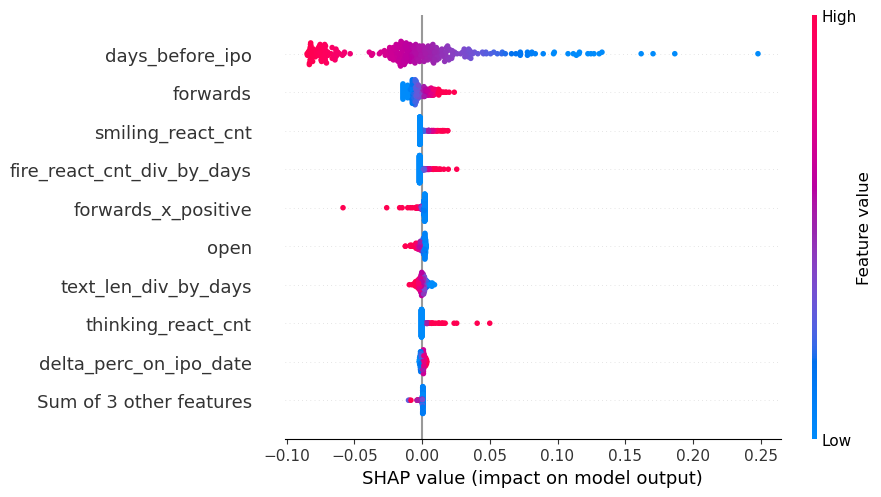

In [30]:
X100 = shap.utils.sample(X_train[cols], 300)

explainer = shap.Explainer(model.predict, X100)
shap_values = explainer(X100)
shap.plots.beeswarm(shap_values)

In [32]:
import statsmodels.api as sm

model = sm.OLS(y, X[cols])
results = model.fit()
results = results.summary()
results

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:               1m_price   R-squared (uncentered):                   0.260
Model:                            OLS   Adj. R-squared (uncentered):              0.260
Method:                 Least Squares   F-statistic:                              1231.
Date:                Sun, 05 May 2024   Prob (F-statistic):                        0.00
Time:                        12:11:52   Log-Likelihood:                          22348.
No. Observations:               41969   AIC:                                 -4.467e+04
Df Residuals:                   41957   BIC:                                 -4.457e+04
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
days_before_ipo              -2.366e-05   5.14e-07    -46.002      0.000   -2.47e-05   -2.26e-05
thinking_react_cnt               0.0011   4.72e-05     23.791      0.000       0.001       0.001
forwards                      5.526e-05    6.2e-06      8.917      0.000    4.31e-05    6.74e-05
views_x_positive_div_by_days  4.982e-06   1.19e-06      4.187      0.000    2.65e-06    7.31e-06
fire_react_cnt_div_by_days       0.0235      0.002      9.722      0.000       0.019       0.028
smiling_react_cnt                0.0002   3.19e-05      6.235      0.000       0.000       0.000
open                             0.0023   2.29e-05     98.289      0.000       0.002       0.002
forwards_x_positive           1.676e-06   5.85e-06      0.287      0.774   -9.79e-06    1.31e-05
text_len_div_by_days             0.0004   2.14e-05     20.521      0.000       0.000       0.000
crying_react_cnt_x_positive   2.204e-06   5.11e-05      0.043      0.966   -9.79e-05       0.000
fire_react_cnt_x_positive     5.701e-05   3.86e-05      1.477      0.140   -1.86e-05       0.000
delta_perc_on_ipo_date           0.0538      0.009      6.268      0.000       0.037       0.071
==============================================================================
Omnibus:                      840.725   Durbin-Watson:                   1.431
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1523.995
Skew:                          -0.152   Prob(JB):                         0.00
Kurtosis:                       3.882   Cond. No.                     2.34e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 2.34e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [33]:
import pickle
 
with open("results/1m_regression.pickle", "wb") as file:
    pickle.dump(results, file)

### Обзор вошедших переменных

In [34]:
cols

['days_before_ipo',
 'thinking_react_cnt',
 'forwards',
 'views_x_positive_div_by_days',
 'fire_react_cnt_div_by_days',
 'smiling_react_cnt',
 'open',
 'forwards_x_positive',
 'text_len_div_by_days',
 'crying_react_cnt_x_positive',
 'fire_react_cnt_x_positive',
 'delta_perc_on_ipo_date']

#### days_before_ipo

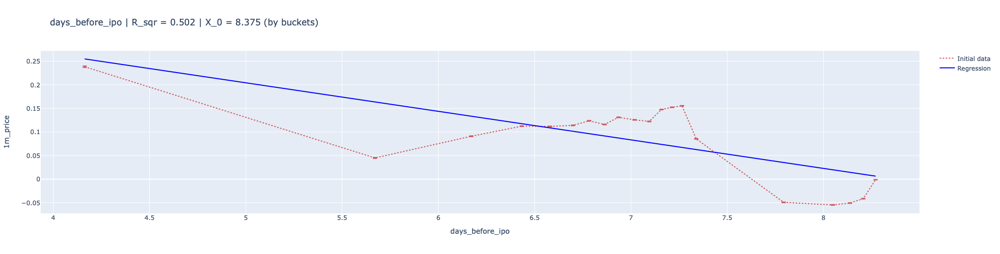

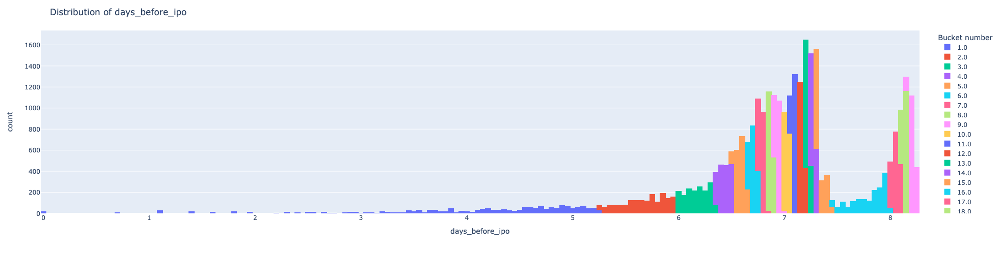

In [36]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='days_before_ipo', target_name=target, interactive = False)

#### forwards

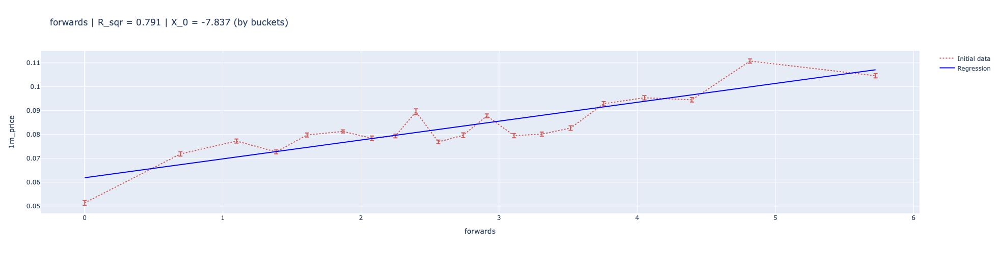

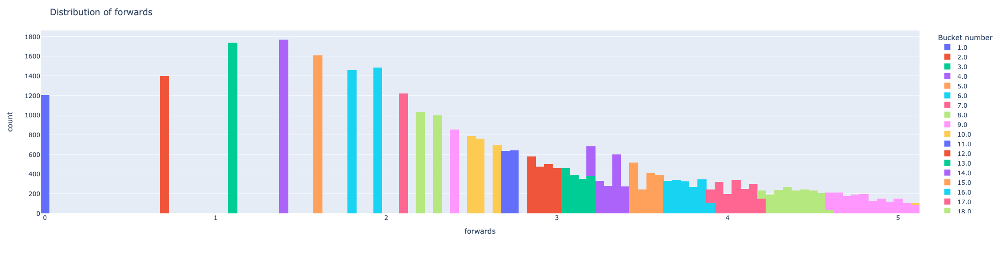

In [41]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='forwards', target_name=target, interactive = False)

#### smiling_react_cnt

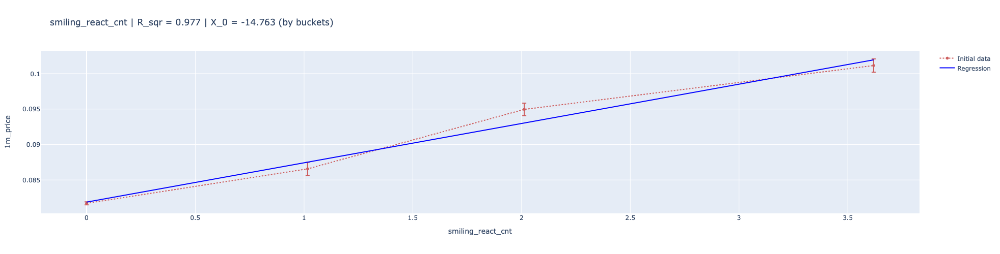

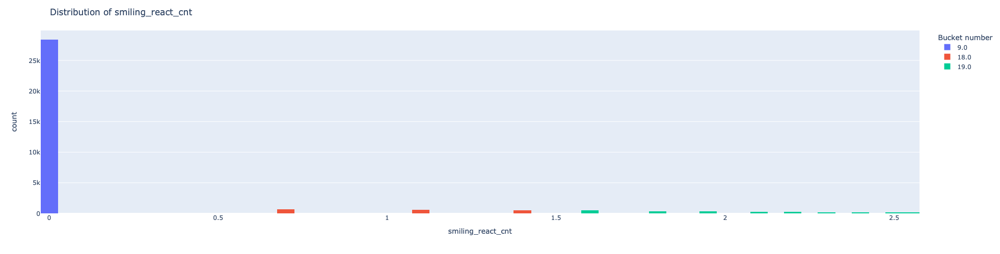

In [38]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='smiling_react_cnt', target_name=target, interactive = False)

#### fire_react_cnt_div_by_days

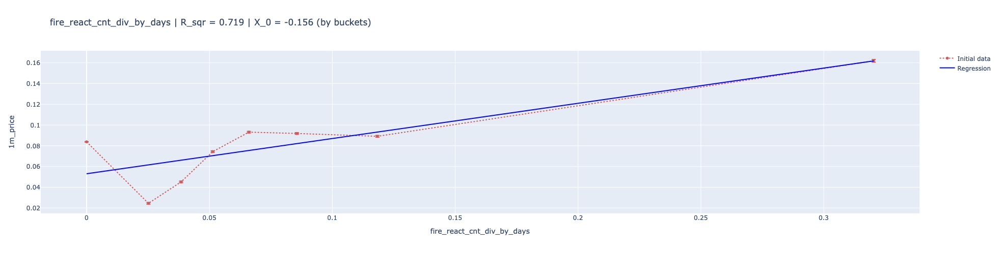

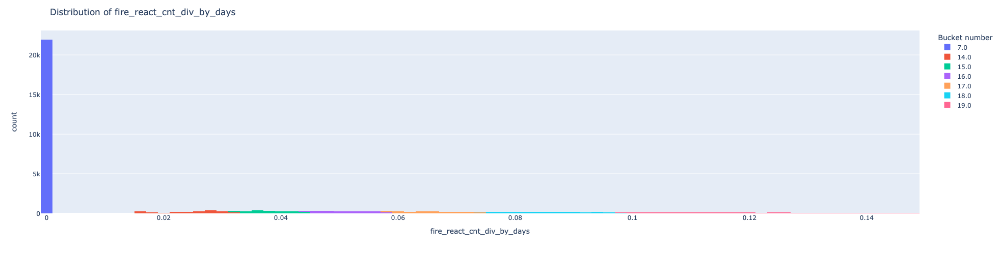

In [39]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='fire_react_cnt_div_by_days', target_name=target, interactive = False)

#### forwards_x_positive

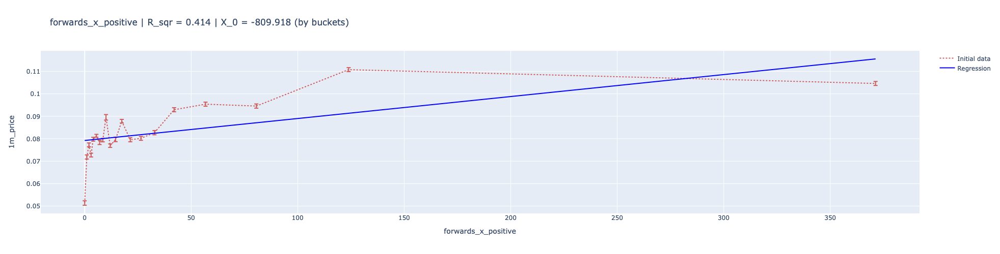

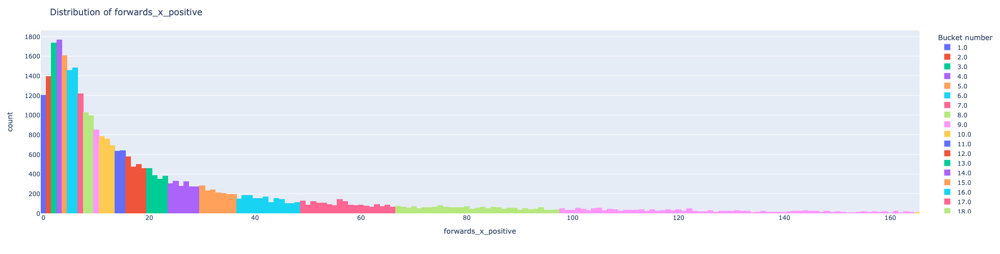

In [42]:
pl.bucket_line(X_train, y, n_buckets=20, feature_name='forwards_x_positive', target_name=target, interactive = False)